In [ ]:
import os
import cv2
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import keras
from keras.callbacks import EarlyStopping,ModelCheckpoint
import tensorflow as tf
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from tqdm import tqdm

In [ ]:
import tensorflow as tf
import tensorflow_datasets as tfds

# Load the PlantVillage dataset
dataset, info = tfds.load('plant_village', with_info=True, as_supervised=True)

# Display basic information about the dataset
print(f"Dataset Info:\n{info}")

# Split the dataset into training and testing sets
train_dataset = dataset['train']

# Take a single example to display
for image, label in train_dataset.take(1):
    print("Image shape:", image.shape)
    print("Label:", label.numpy())


Dl Completed...: 0 url [00:00, ? url/s]

Dl Size...: 0 MiB [00:00, ? MiB/s]

Extraction completed...: 0 file [00:00, ? file/s]

Generating splits...:   0%|          | 0/1 [00:00<?, ? splits/s]

Generating train examples...:   0%|          | 0/54303 [00:00<?, ? examples/s]

Shuffling /root/tensorflow_datasets/plant_village/incomplete.DCNZ6H_1.0.2/plant_village-train.tfrecord*...:   …

Dataset plant_village downloaded and prepared to /root/tensorflow_datasets/plant_village/1.0.2. Subsequent calls will reuse this data.
Dataset Info:
tfds.core.DatasetInfo(
    name='plant_village',
    full_name='plant_village/1.0.2',
    description="""
    The PlantVillage dataset consists of 54303 healthy and unhealthy leaf images
    divided into 38 categories by species and disease.
    
    NOTE: The original dataset is not available from the original source
    (plantvillage.org), therefore we get the unaugmented dataset from a paper that
    used that dataset and republished it. Moreover, we dropped images with
    Background_without_leaves label, because these were not present in the original
    dataset.
    
    Original paper URL: https://arxiv.org/abs/1511.08060 Dataset URL:
    https://data.mendeley.com/datasets/tywbtsjrjv/1
    """,
    homepage='https://arxiv.org/abs/1511.08060',
    data_dir=PosixGPath('/tmp/tmpm8k9ro0etfds'),
    file_format=tfrecord,
    download_siz

In [ ]:
# Modify the 'data' function to handle TensorFlow dataset
def data(tf_dataset):
    images = []
    labels = []

    # Loop through the TensorFlow dataset
    for image, label in tqdm(tf_dataset):
        # Append the image as a numpy array (or keep it as a tensor if desired)
        images.append(image.numpy())  # You can store image paths, or store the image arrays directly
        labels.append(label.numpy())  # Append the label as an integer

    # Create a DataFrame with the images and labels
    df = pd.DataFrame({'image': images, 'label': labels})
    return df

# Process the train dataset into a DataFrame
train_df = data(train_dataset)

# Display the first few rows of the DataFrame
print(train_df.head())

100%|██████████| 54303/54303 [00:24<00:00, 2176.68it/s]


                                               image  label
0  [[[171, 161, 169], [158, 148, 156], [153, 143,...     35
1  [[[168, 130, 119], [168, 130, 119], [167, 129,...     15
2  [[[3, 3, 3], [3, 3, 3], [3, 3, 3], [3, 3, 3], ...     31
3  [[[193, 192, 200], [192, 191, 199], [189, 188,...     20
4  [[[96, 98, 121], [114, 116, 139], [99, 101, 12...      3


# <p><center style="font-family:newtimeroman;font-size:180%;"> Plant Village Disease Classification </center></p>
### Table of contents:

* [Import Libraries](#1)
* [Read Data](#2)
* [Visualization Of Dataset](#3)
* [Data Augmentation](#4)
* [Train CNN Model](#5)
* [Evaluate The Model](#6)

**<a id="1"></a>
# <p style="background-image: url(https://i.postimg.cc/K87ByXmr/stage5.jpg);font-family:camtasia;font-size:120%;color:white;text-align:center;border-radius:15px 50px; padding:7px">Import Libraries </p>
<a class="btn" href="#home">Tabel of Contents</a>

**<a id="2"></a>
# <p style="background-image: url(https://i.postimg.cc/K87ByXmr/stage5.jpg);font-family:camtasia;font-size:120%;color:white;text-align:center;border-radius:15px 50px; padding:7px">Read Data </p>
<a class="btn" href="#home">Tabel of Contents</a>

In [ ]:
# def data(dataset_path):
#     images = []
#     labels = []
#     for subfolder in tqdm(os.listdir(dataset_path)):
#         subfolder_path = os.path.join(dataset_path, subfolder)
#         for image_filename in os.listdir(subfolder_path):
#             image_path = os.path.join(subfolder_path, image_filename)
#             images.append(image_path)
#             labels.append(subfolder)
#     df = pd.DataFrame({'image': images, 'label': labels})
#     return df

In [ ]:
# #train
# train = data(train_dataset)
# train.head()

In [ ]:
train_df.shape

(54303, 2)

**<a id="3"></a>
# <p style="background-image: url(https://i.postimg.cc/K87ByXmr/stage5.jpg);font-family:camtasia;font-size:120%;color:white;text-align:center;border-radius:15px 50px; padding:7px">Visualization of Dataset </p>
<a class="btn" href="#home">Tabel of Contents</a>

In [ ]:
# Get the label names from the dataset info
label_names = info.features['label'].names

# Create a mapping from label number to label name
label_map = {i: label_names[i] for i in range(len(label_names))}

# Map the label numbers in the DataFrame to their corresponding names
train_df['label_name'] = train_df['label'].map(label_map)

# Now you can check the count of each label name
label_counts = train_df['label_name'].value_counts().to_frame()
print(label_counts)


                                               count
label_name                                          
Orange___Haunglongbing_(Citrus_greening)        5507
Tomato___Tomato_Yellow_Leaf_Curl_Virus          5357
Soybean___healthy                               5090
Peach___Bacterial_spot                          2297
Tomato___Bacterial_spot                         2127
Tomato___Late_blight                            1908
Squash___Powdery_mildew                         1835
Tomato___Septoria_leaf_spot                     1771
Tomato___Spider_mites Two-spotted_spider_mite   1676
Apple___healthy                                 1645
Tomato___healthy                                1591
Blueberry___healthy                             1502
Pepper,_bell___healthy                          1477
Tomato___Target_Spot                            1404
Grape___Esca_(Black_Measles)                    1383
Corn___Common_rust                              1192
Grape___Black_rot                             

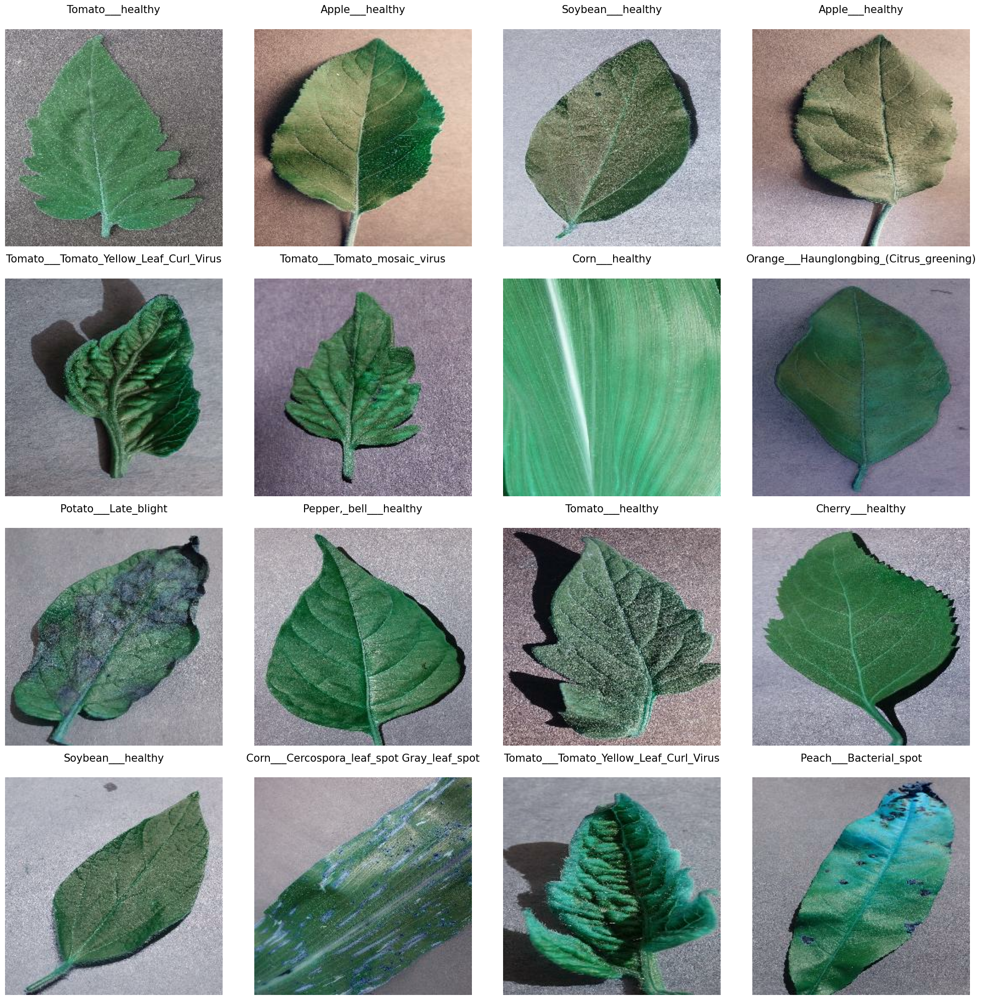

In [ ]:
import matplotlib.pyplot as plt
import cv2
import numpy as np

# Ensure that the images in train_df are paths; if not, you need to adjust
plt.figure(figsize=(20, 20))  # Reduced the figure size for better visualization

# Randomly select 16 images from the dataset
for n, i in enumerate(np.random.randint(0, len(train_df), 16)):
    plt.subplot(4, 4, n + 1)

    # Load the image using OpenCV
    img = cv2.cvtColor(train_df['image'][i], cv2.COLOR_BGR2RGB)

    # Display the image
    plt.imshow(img)
    plt.axis('off')

    # Get the label name
    text = f'{train_df["label_name"][i]}\n'
    plt.title(text, fontsize=15)

plt.tight_layout()
plt.show()


<a id="4"></a>
# <p style="background-image: url(https://i.postimg.cc/K87ByXmr/stage5.jpg);font-family:camtasia;font-size:120%;color:white;text-align:center;border-radius:15px 50px; padding:7px"> Data Augmentation </p>
<a class="btn" href="#home">Tabel of Contents</a>

In [ ]:
from sklearn.model_selection import train_test_split
import pandas as pd

# Split the dataset into training and temporary test set (80% train, 20% test1)
X_train, X_test1, y_train, y_test1 = train_test_split(
    train_df['image'],
    train_df['label'],
    test_size=0.2,
    random_state=42,
    shuffle=True,
    stratify=train_df['label']
)

# Further split test1 into validation and test sets (50% of 20%, i.e., 10% of original data each)
X_val, X_test, y_val, y_test = train_test_split(
    X_test1,
    y_test1,
    test_size=0.5,
    random_state=42,
    shuffle=True,
    stratify=y_test1
)

# Create DataFrames for each set
df_train = pd.DataFrame({'image': X_train, 'label': y_train})
df_val = pd.DataFrame({'image': X_val, 'label': y_val})
df_test = pd.DataFrame({'image': X_test, 'label': y_test})

# Display the first few rows of each DataFrame to check the splits
print("Training Set:")
print(df_train.head())
print("\nValidation Set:")
print(df_val.head())
print("\nTest Set:")
print(df_test.head())


Training Set:
                                                   image  label
38852  [[[225, 215, 213], [218, 208, 206], [213, 203,...     27
18562  [[[155, 150, 154], [154, 149, 153], [152, 147,...     25
27135  [[[121, 130, 129], [119, 128, 127], [118, 127,...     15
44680  [[[153, 141, 145], [144, 132, 136], [152, 140,...     35
7168   [[[225, 220, 226], [223, 218, 224], [220, 215,...     24

Validation Set:
                                                   image  label
32806  [[[143, 151, 198], [143, 151, 198], [145, 153,...      0
46877  [[[199, 188, 184], [207, 196, 192], [213, 202,...     24
44236  [[[135, 115, 116], [116, 96, 97], [127, 107, 1...     15
34060  [[[89, 89, 91], [91, 91, 93], [94, 94, 96], [9...     15
9484   [[[144, 141, 148], [144, 141, 148], [145, 142,...     16

Test Set:
                                                   image  label
26345  [[[147, 143, 144], [139, 135, 136], [148, 144,...     12
38959  [[[126, 131, 125], [127, 132, 126], [127, 132,...     3

In [ ]:
import numpy as np
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import pandas as pd
from sklearn.model_selection import train_test_split

# Convert image arrays to NumPy arrays if needed
X_train = np.array(list(df_train['image']))  # Convert list of arrays to a single NumPy array
X_val = np.array(list(df_val['image']))
X_test = np.array(list(df_test['image']))

# Convert labels to NumPy arrays
y_train = np.array(df_train['label'])
y_val = np.array(df_val['label'])
y_test = np.array(df_test['label'])

# Image dimensions and batch size
image_size = (224, 224)
batch_size = 32

# Create data generator for test/validation with rescaling
datagen = ImageDataGenerator(rescale=1./255)

# Create train data generator with augmentation
train_datagen = ImageDataGenerator(
    rescale=1./255,
    horizontal_flip=True,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2
)

# Train generator using image arrays and labels
train_generator = train_datagen.flow(
    X_train,              # Image arrays
    y_train,              # Corresponding labels
    batch_size=batch_size,
    shuffle=True
)

# Validation generator
val_generator = datagen.flow(
    X_val,                # Image arrays
    y_val,                # Corresponding labels
    batch_size=batch_size,
    shuffle=False
)

# Test generator
test_generator = datagen.flow(
    X_test,               # Image arrays
    y_test,               # Corresponding labels
    batch_size=batch_size,
    shuffle=False
)


In [ ]:
# Assuming label_map is already defined (mapping integers to class names)
# Example: label_map = {0: 'ClassA', 1: 'ClassB', 2: 'ClassC'}

# Get the unique labels in the test set
unique_labels = np.unique(y_test)

# Use the label_map to convert the integer labels into class names
class_ = [label_map[label] for label in unique_labels]

# Display the class names
print("Class names:", class_)


Class names: ['Apple___Apple_scab', 'Apple___Black_rot', 'Apple___Cedar_apple_rust', 'Apple___healthy', 'Blueberry___healthy', 'Cherry___healthy', 'Cherry___Powdery_mildew', 'Corn___Cercospora_leaf_spot Gray_leaf_spot', 'Corn___Common_rust', 'Corn___healthy', 'Corn___Northern_Leaf_Blight', 'Grape___Black_rot', 'Grape___Esca_(Black_Measles)', 'Grape___healthy', 'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)', 'Orange___Haunglongbing_(Citrus_greening)', 'Peach___Bacterial_spot', 'Peach___healthy', 'Pepper,_bell___Bacterial_spot', 'Pepper,_bell___healthy', 'Potato___Early_blight', 'Potato___healthy', 'Potato___Late_blight', 'Raspberry___healthy', 'Soybean___healthy', 'Squash___Powdery_mildew', 'Strawberry___healthy', 'Strawberry___Leaf_scorch', 'Tomato___Bacterial_spot', 'Tomato___Early_blight', 'Tomato___healthy', 'Tomato___Late_blight', 'Tomato___Leaf_Mold', 'Tomato___Septoria_leaf_spot', 'Tomato___Spider_mites Two-spotted_spider_mite', 'Tomato___Target_Spot', 'Tomato___Tomato_mosaic_virus

<a id="5"></a>
# <p style="background-image: url(https://i.postimg.cc/K87ByXmr/stage5.jpg);font-family:camtasia;font-size:120%;color:white;text-align:center;border-radius:15px 50px; padding:7px"> Modeling </p>
<a class="btn" href="#home">Tabel of Contents</a>

In [ ]:
# model = keras.models.Sequential([
#     keras.layers.Conv2D(32, kernel_size = (3,3), activation = 'relu', input_shape = (224,224,3)),
#     keras.layers.MaxPooling2D(2,2),

#     keras.layers.Conv2D(64, kernel_size = (3,3), activation = 'relu'),
#     keras.layers.MaxPooling2D(2,2),

#     keras.layers.Conv2D(64, kernel_size = (3,3), activation = 'relu'),
#     keras.layers.MaxPooling2D(2,2),

#     keras.layers.Conv2D(64, kernel_size = (3,3), activation = 'relu'),
#     keras.layers.MaxPooling2D(2,2),

#     keras.layers.Conv2D(64, kernel_size = (3,3), activation = 'relu'),
#     keras.layers.MaxPooling2D(2,2),

#     keras.layers.Conv2D(64, kernel_size = (3,3), activation = 'relu'),
#     keras.layers.MaxPooling2D(2,2),

#     keras.layers.Flatten(),

#     keras.layers.Dense(64, activation='relu'),

#     keras.layers.Dense(38, activation='softmax'),

# ])
# model.summary()

In [ ]:
import tensorflow as tf
from tensorflow import keras

model = keras.models.Sequential([

    # 1st Convolutional Layer
    keras.layers.Conv2D(32, kernel_size=(3, 3), activation='relu', input_shape=(224, 224, 3)),
    keras.layers.MaxPooling2D(pool_size=(2, 2)),

    # 2nd Convolutional Layer
    keras.layers.Conv2D(64, kernel_size=(3, 3), activation='relu'),
    keras.layers.MaxPooling2D(pool_size=(2, 2)),

    # 3rd Convolutional Layer
    keras.layers.Conv2D(64, kernel_size=(3, 3), activation='relu'),
    keras.layers.MaxPooling2D(pool_size=(2, 2)),

    # 4th Convolutional Layer
    keras.layers.Conv2D(64, kernel_size=(3, 3), activation='relu'),
    keras.layers.MaxPooling2D(pool_size=(2, 2)),

    # 5th Convolutional Layer
    keras.layers.Conv2D(64, kernel_size=(3, 3), activation='relu'),
    keras.layers.MaxPooling2D(pool_size=(2, 2)),

    # 6th Convolutional Layer
    keras.layers.Conv2D(64, kernel_size=(3, 3), activation='relu'),
    keras.layers.MaxPooling2D(pool_size=(2, 2)),

    # Use Global Average Pooling instead of Flatten
    keras.layers.GlobalAveragePooling2D(),

    # Fully Connected Layer
    keras.layers.Dense(64, activation='relu'),

    # Output Layer (38 classes with softmax activation)
    keras.layers.Dense(38, activation='softmax'),

])

# Compile the model
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Display the model summary
model.summary()


Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_10 (Conv2D)                   │ (None, 222, 222, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_10 (MaxPooling2D)      │ (None, 111, 111, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_11 (Conv2D)                   │ (None, 109, 109, 64)        │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_11 (MaxPooling2D)      │ (None, 54, 54, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_12 (Conv2D)                   │ (None, 52, 52, 64)          │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_12 (MaxPooling2D)      │ (None, 26, 26, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_13 (Conv2D)                   │ (None, 24, 24, 64)          │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_13 (MaxPooling2D)      │ (None, 12, 12, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_14 (Conv2D)                   │ (None, 10, 10, 64)          │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_14 (MaxPooling2D)      │ (None, 5, 5, 64)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_15 (Conv2D)                   │ (None, 3, 3, 64)            │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_15 (MaxPooling2D)      │ (None, 1, 1, 64)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d_1           │ (None, 64)                  │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4 (Dense)                      │ (None, 64)                  │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5 (Dense)                      │ (None, 38)                  │           2,470 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 173,734 (678.65 KB)

 Trainable params: 173,734 (678.65 KB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping
import os

# Define the directory where the model will be saved
save_dir = '/content/drive/MyDrive/Capstone/PlantDoc-Dataset-master/'

# Create the directory if it doesn't exist
os.makedirs(save_dir, exist_ok=True)

# Define the checkpoint callback to save the model every 5 epochs
checkpoint_cb = ModelCheckpoint(
    filepath=os.path.join(save_dir, "model_epochv2_{epoch:02d}.keras"),  # Save with epoch number in the filename
    save_best_only=False,  # We want to save every 5 epochs, not just the best
    save_freq=5 * len(train_generator),  # Save every 5 epochs
)

# Early stopping callback to stop training if validation doesn't improve
early_stopping_cb = EarlyStopping(patience=5, restore_best_weights=True)

# Compile the model using sparse_categorical_crossentropy for integer labels
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy', keras.metrics.AUC()])

# Fit the model with the callbacks
hist = model.fit(
    train_generator,
    epochs=100,
    validation_data=val_generator,
    callbacks=[checkpoint_cb, early_stopping_cb]
)



Epoch 1/100


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


InvalidArgumentError: Graph execution error:

Detected at node UnsortedSegmentSum defined at (most recent call last):
<stack traces unavailable>
UnsortedSegmentSum requires indices shape to be prefix of data_shape, but dimension 0 differs 32 vs. 1216

Stack trace for op definition: 
File "/usr/lib/python3.10/runpy.py", line 196, in _run_module_as_main
File "/usr/lib/python3.10/runpy.py", line 86, in _run_code
File "/usr/local/lib/python3.10/dist-packages/colab_kernel_launcher.py", line 37, in <module>
File "/usr/local/lib/python3.10/dist-packages/traitlets/config/application.py", line 992, in launch_instance
File "/usr/local/lib/python3.10/dist-packages/ipykernel/kernelapp.py", line 619, in start
File "/usr/local/lib/python3.10/dist-packages/tornado/platform/asyncio.py", line 195, in start
File "/usr/lib/python3.10/asyncio/base_events.py", line 603, in run_forever
File "/usr/lib/python3.10/asyncio/base_events.py", line 1909, in _run_once
File "/usr/lib/python3.10/asyncio/events.py", line 80, in _run
File "/usr/local/lib/python3.10/dist-packages/tornado/ioloop.py", line 685, in <lambda>
File "/usr/local/lib/python3.10/dist-packages/tornado/ioloop.py", line 738, in _run_callback
File "/usr/local/lib/python3.10/dist-packages/tornado/gen.py", line 825, in inner
File "/usr/local/lib/python3.10/dist-packages/tornado/gen.py", line 786, in run
File "/usr/local/lib/python3.10/dist-packages/ipykernel/kernelbase.py", line 361, in process_one
File "/usr/local/lib/python3.10/dist-packages/tornado/gen.py", line 234, in wrapper
File "/usr/local/lib/python3.10/dist-packages/ipykernel/kernelbase.py", line 261, in dispatch_shell
File "/usr/local/lib/python3.10/dist-packages/tornado/gen.py", line 234, in wrapper
File "/usr/local/lib/python3.10/dist-packages/ipykernel/kernelbase.py", line 539, in execute_request
File "/usr/local/lib/python3.10/dist-packages/tornado/gen.py", line 234, in wrapper
File "/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py", line 302, in do_execute
File "/usr/local/lib/python3.10/dist-packages/ipykernel/zmqshell.py", line 539, in run_cell
File "/usr/local/lib/python3.10/dist-packages/IPython/core/interactiveshell.py", line 2975, in run_cell
File "/usr/local/lib/python3.10/dist-packages/IPython/core/interactiveshell.py", line 3030, in _run_cell
File "/usr/local/lib/python3.10/dist-packages/IPython/core/async_helpers.py", line 78, in _pseudo_sync_runner
File "/usr/local/lib/python3.10/dist-packages/IPython/core/interactiveshell.py", line 3257, in run_cell_async
File "/usr/local/lib/python3.10/dist-packages/IPython/core/interactiveshell.py", line 3473, in run_ast_nodes
File "/usr/local/lib/python3.10/dist-packages/IPython/core/interactiveshell.py", line 3553, in run_code
File "<ipython-input-18-2395581a5693>", line 24, in <cell line: 24>
File "/usr/local/lib/python3.10/dist-packages/keras/src/utils/traceback_utils.py", line 117, in error_handler
File "/usr/local/lib/python3.10/dist-packages/keras/src/backend/tensorflow/trainer.py", line 318, in fit
File "/usr/local/lib/python3.10/dist-packages/keras/src/backend/tensorflow/trainer.py", line 121, in one_step_on_iterator
File "/usr/local/lib/python3.10/dist-packages/keras/src/backend/tensorflow/trainer.py", line 108, in one_step_on_data
File "/usr/local/lib/python3.10/dist-packages/keras/src/backend/tensorflow/trainer.py", line 77, in train_step
File "/usr/local/lib/python3.10/dist-packages/keras/src/trainers/trainer.py", line 444, in compute_metrics
File "/usr/local/lib/python3.10/dist-packages/keras/src/trainers/compile_utils.py", line 330, in update_state
File "/usr/local/lib/python3.10/dist-packages/keras/src/trainers/compile_utils.py", line 17, in update_state
File "/usr/local/lib/python3.10/dist-packages/keras/src/metrics/confusion_metrics.py", line 1376, in update_state
File "/usr/local/lib/python3.10/dist-packages/keras/src/metrics/metrics_utils.py", line 481, in update_confusion_matrix_variables
File "/usr/local/lib/python3.10/dist-packages/keras/src/metrics/metrics_utils.py", line 272, in _update_confusion_matrix_variables_optimized
File "/usr/local/lib/python3.10/dist-packages/keras/src/ops/math.py", line 59, in segment_sum
File "/usr/local/lib/python3.10/dist-packages/keras/src/backend/tensorflow/math.py", line 17, in segment_sum

	 [[{{node UnsortedSegmentSum}}]]
	tf2xla conversion failed while converting __inference_one_step_on_data_112561[]. Run with TF_DUMP_GRAPH_PREFIX=/path/to/dump/dir and --vmodule=xla_compiler=2 to obtain a dump of the compiled functions.
	 [[StatefulPartitionedCall]] [Op:__inference_one_step_on_iterator_112684]

In [ ]:
# checkpoint_cb =ModelCheckpoint("my_keras_model.keras", save_best_only=True)
# early_stopping_cb =EarlyStopping(patience=5, restore_best_weights=True)
# model.compile(optimizer ='adam', loss='categorical_crossentropy', metrics=['accuracy',keras.metrics.AUC()])
# hist=model.fit(train_generator,epochs=20,validation_data=val_generator,callbacks=[checkpoint_cb,early_stopping_cb])

<a id="6"></a>
# <p style="background-image: url(https://i.postimg.cc/K87ByXmr/stage5.jpg);font-family:camtasia;font-size:120%;color:white;text-align:center;border-radius:15px 50px; padding:7px"> Evaluate The Model  </p>
<a class="btn" href="#home">Tabel of Contents</a>

In [ ]:
hist_=pd.DataFrame(hist.history)
hist_

In [ ]:
plt.figure(figsize=(25,10))
plt.subplot(1,3,1)
plt.plot(hist_['loss'],'b-o',label='Train_Loss')
plt.plot(hist_['val_loss'],'r-o',label='Validation_Loss')
plt.title('Train_Loss & Validation_Loss',fontsize=20)
plt.legend()
plt.subplot(1,3,2)
plt.plot(hist_['accuracy'],'b-o',label='Train_Accuracy')
plt.plot(hist_['val_accuracy'],'r-o',label='Validation_Accuracy')
plt.title('Train_Accuracy & Validation_Accuracy',fontsize=20)
plt.legend()
plt.subplot(1,3,3)
plt.plot(hist_.iloc[:,1],'b-o',label='Train_auc')
plt.plot(hist_.iloc[:,4],'r-o',label='Validation_auc')
plt.title('Train_AUC & Validation_AUC',fontsize=20)
plt.legend()
plt.show()

In [ ]:
score, acc,auc = model.evaluate(test_generator)
print('Test Loss =', score)
print('Test Accuracy =', acc)
print('Test AUC =', auc)

In [ ]:
# Get true labels
y_test = test_generator.classes
# Predict probabilities for each class
predictions = model.predict(test_generator)
# Convert predicted probabilities to class labels (choose the class with the highest probability)
y_pred = np.argmax(predictions, axis=1)
# Flatten both arrays just in case
y_test = np.ravel(y_test)
y_pred = np.ravel(y_pred)
# Create a DataFrame to compare actual vs predicted labels
df = pd.DataFrame({'Actual': y_test, 'Prediction': y_pred})
# Display the DataFrame
df.head()  # Show the first few rows of the comparison

In [ ]:
batch = next(test_generator)
images= batch[0]
plt.figure(figsize=(50,80))
for n in range(32):
    plt.subplot(8,4,n+1)
    plt.imshow(images[n])
    plt.axis('off')
    text = f'Actual : {class_[int(y_test[n])]}\npred : {class_[int(y_pred[n])]}\n'
    plt.title(text,fontsize=25)

In [ ]:
CM = confusion_matrix(y_test,y_pred)
plt.figure(figsize=(15,25))
sns.heatmap(CM,fmt='g',center = True,cbar=False,annot=True,cmap='Set2',xticklabels=class_,yticklabels=class_)
CM

In [ ]:
ClassificationReport = classification_report(y_test,y_pred,target_names=class_)
print('Classification Report is : ', ClassificationReport)

In [ ]:
import os
import cv2
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from sklearn.metrics import confusion_matrix, classification_report
from tqdm import tqdm
import tensorflow as tf
import tensorflow_datasets as tfds
from tensorflow import keras

# Load the PlantVillage dataset
dataset, info = tfds.load('plant_village', with_info=True, as_supervised=True)

# Display basic information about the dataset
print(f"Dataset Info:\n{info}")

# Split the dataset into training and testing sets
train_dataset = dataset['train']

# Take a single example to display
for image, label in train_dataset.take(1):
    print("Image shape:", image.shape)
    print("Label:", label.numpy())


# Modify the 'data' function to handle TensorFlow dataset
def data(tf_dataset):
    images = []
    labels = []
    # Loop through the TensorFlow dataset
    for image, label in tqdm(tf_dataset):
        images.append(image.numpy())  # Convert image tensors to NumPy arrays
        labels.append(label.numpy())  # Convert label tensors to integers
    # Create a DataFrame with the images and labels
    df = pd.DataFrame({'image': images, 'label': labels})
    return df

# Process the train dataset into a DataFrame
train_df = data(train_dataset)

# Get the label names from the dataset info
label_names = info.features['label'].names
# Create a mapping from label number to label name
label_map = {i: label_names[i] for i in range(len(label_names))}
train_df['label_name'] = train_df['label'].map(label_map)

# Split the dataset into training, validation, and test sets
X_train, X_test1, y_train, y_test1 = train_test_split(
    train_df['image'], train_df['label'], test_size=0.2, random_state=42, stratify=train_df['label'])

X_val, X_test, y_val, y_test = train_test_split(
    X_test1, y_test1, test_size=0.5, random_state=42, stratify=y_test1)

# Convert data to NumPy arrays
X_train = np.array(list(X_train))
X_val = np.array(list(X_val))
X_test = np.array(list(X_test))
y_train = np.array(y_train)
y_val = np.array(y_val)
y_test = np.array(y_test)

# Image augmentation and data generation
image_size = (224, 224)
batch_size = 32

datagen = ImageDataGenerator(rescale=1./255)

train_datagen = ImageDataGenerator(
    rescale=1./255,
    horizontal_flip=True,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2
)

# Generators for training, validation, and test data
train_generator = train_datagen.flow(X_train, y_train, batch_size=batch_size, shuffle=True)
val_generator = datagen.flow(X_val, y_val, batch_size=batch_size, shuffle=False)
test_generator = datagen.flow(X_test, y_test, batch_size=batch_size, shuffle=False)

# Model architecture
model = keras.models.Sequential([

    keras.layers.Conv2D(32, kernel_size=(3, 3), activation='relu', input_shape=(224, 224, 3)),
    keras.layers.MaxPooling2D(pool_size=(2, 2)),

    keras.layers.Conv2D(64, kernel_size=(3, 3), activation='relu'),
    keras.layers.MaxPooling2D(pool_size=(2, 2)),

    keras.layers.Conv2D(64, kernel_size=(3, 3), activation='relu'),
    keras.layers.MaxPooling2D(pool_size=(2, 2)),

    keras.layers.Conv2D(64, kernel_size=(3, 3), activation='relu'),
    keras.layers.MaxPooling2D(pool_size=(2, 2)),

    keras.layers.Conv2D(64, kernel_size=(3, 3), activation='relu'),
    keras.layers.MaxPooling2D(pool_size=(2, 2)),

    keras.layers.GlobalAveragePooling2D(),

    keras.layers.Dense(64, activation='relu'),
    keras.layers.Dense(38, activation='softmax')
])

# Compile the model
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy', keras.metrics.AUC()])

# Checkpointing and Early Stopping
save_dir = '/content/drive/MyDrive/Capstone/PlantDoc-Dataset-master/'
os.makedirs(save_dir, exist_ok=True)

checkpoint_cb = ModelCheckpoint(
    filepath=os.path.join(save_dir, "model_epochv2_{epoch:02d}.keras"),
    save_best_only=False,  # Save every 5 epochs
    save_freq=5 * len(train_generator)  # Save every 5 epochs
)

early_stopping_cb = EarlyStopping(patience=5, restore_best_weights=True)

# Train the model
hist = model.fit(
    train_generator,
    epochs=100,
    validation_data=val_generator,
    callbacks=[checkpoint_cb, early_stopping_cb]
)

# Model summary
model.summary()

# Check class labels
class_ = [label_map[label] for label in np.unique(y_test)]
print("Class names:", class_)


Dataset Info:
tfds.core.DatasetInfo(
    name='plant_village',
    full_name='plant_village/1.0.2',
    description="""
    The PlantVillage dataset consists of 54303 healthy and unhealthy leaf images
    divided into 38 categories by species and disease.
    
    NOTE: The original dataset is not available from the original source
    (plantvillage.org), therefore we get the unaugmented dataset from a paper that
    used that dataset and republished it. Moreover, we dropped images with
    Background_without_leaves label, because these were not present in the original
    dataset.
    
    Original paper URL: https://arxiv.org/abs/1511.08060 Dataset URL:
    https://data.mendeley.com/datasets/tywbtsjrjv/1
    """,
    homepage='https://arxiv.org/abs/1511.08060',
    data_dir='/root/tensorflow_datasets/plant_village/1.0.2',
    file_format=tfrecord,
    download_size=827.82 MiB,
    dataset_size=815.37 MiB,
    features=FeaturesDict({
        'image': Image(shape=(None, None, 3), dtype

100%|██████████| 54303/54303 [00:25<00:00, 2119.34it/s]
/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


InvalidArgumentError: Graph execution error:

Detected at node UnsortedSegmentSum defined at (most recent call last):
<stack traces unavailable>
UnsortedSegmentSum requires indices shape to be prefix of data_shape, but dimension 0 differs 32 vs. 1216

Stack trace for op definition: 
File "/usr/lib/python3.10/runpy.py", line 196, in _run_module_as_main
File "/usr/lib/python3.10/runpy.py", line 86, in _run_code
File "/usr/local/lib/python3.10/dist-packages/colab_kernel_launcher.py", line 37, in <module>
File "/usr/local/lib/python3.10/dist-packages/traitlets/config/application.py", line 992, in launch_instance
File "/usr/local/lib/python3.10/dist-packages/ipykernel/kernelapp.py", line 619, in start
File "/usr/local/lib/python3.10/dist-packages/tornado/platform/asyncio.py", line 195, in start
File "/usr/lib/python3.10/asyncio/base_events.py", line 603, in run_forever
File "/usr/lib/python3.10/asyncio/base_events.py", line 1909, in _run_once
File "/usr/lib/python3.10/asyncio/events.py", line 80, in _run
File "/usr/local/lib/python3.10/dist-packages/tornado/ioloop.py", line 685, in <lambda>
File "/usr/local/lib/python3.10/dist-packages/tornado/ioloop.py", line 738, in _run_callback
File "/usr/local/lib/python3.10/dist-packages/tornado/gen.py", line 825, in inner
File "/usr/local/lib/python3.10/dist-packages/tornado/gen.py", line 786, in run
File "/usr/local/lib/python3.10/dist-packages/ipykernel/kernelbase.py", line 361, in process_one
File "/usr/local/lib/python3.10/dist-packages/tornado/gen.py", line 234, in wrapper
File "/usr/local/lib/python3.10/dist-packages/ipykernel/kernelbase.py", line 261, in dispatch_shell
File "/usr/local/lib/python3.10/dist-packages/tornado/gen.py", line 234, in wrapper
File "/usr/local/lib/python3.10/dist-packages/ipykernel/kernelbase.py", line 539, in execute_request
File "/usr/local/lib/python3.10/dist-packages/tornado/gen.py", line 234, in wrapper
File "/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py", line 302, in do_execute
File "/usr/local/lib/python3.10/dist-packages/ipykernel/zmqshell.py", line 539, in run_cell
File "/usr/local/lib/python3.10/dist-packages/IPython/core/interactiveshell.py", line 2975, in run_cell
File "/usr/local/lib/python3.10/dist-packages/IPython/core/interactiveshell.py", line 3030, in _run_cell
File "/usr/local/lib/python3.10/dist-packages/IPython/core/async_helpers.py", line 78, in _pseudo_sync_runner
File "/usr/local/lib/python3.10/dist-packages/IPython/core/interactiveshell.py", line 3257, in run_cell_async
File "/usr/local/lib/python3.10/dist-packages/IPython/core/interactiveshell.py", line 3473, in run_ast_nodes
File "/usr/local/lib/python3.10/dist-packages/IPython/core/interactiveshell.py", line 3553, in run_code
File "<ipython-input-1-e2a8b3299c97>", line 129, in <cell line: 129>
File "/usr/local/lib/python3.10/dist-packages/keras/src/utils/traceback_utils.py", line 117, in error_handler
File "/usr/local/lib/python3.10/dist-packages/keras/src/backend/tensorflow/trainer.py", line 318, in fit
File "/usr/local/lib/python3.10/dist-packages/keras/src/backend/tensorflow/trainer.py", line 121, in one_step_on_iterator
File "/usr/local/lib/python3.10/dist-packages/keras/src/backend/tensorflow/trainer.py", line 108, in one_step_on_data
File "/usr/local/lib/python3.10/dist-packages/keras/src/backend/tensorflow/trainer.py", line 77, in train_step
File "/usr/local/lib/python3.10/dist-packages/keras/src/trainers/trainer.py", line 444, in compute_metrics
File "/usr/local/lib/python3.10/dist-packages/keras/src/trainers/compile_utils.py", line 330, in update_state
File "/usr/local/lib/python3.10/dist-packages/keras/src/trainers/compile_utils.py", line 17, in update_state
File "/usr/local/lib/python3.10/dist-packages/keras/src/metrics/confusion_metrics.py", line 1376, in update_state
File "/usr/local/lib/python3.10/dist-packages/keras/src/metrics/metrics_utils.py", line 481, in update_confusion_matrix_variables
File "/usr/local/lib/python3.10/dist-packages/keras/src/metrics/metrics_utils.py", line 272, in _update_confusion_matrix_variables_optimized
File "/usr/local/lib/python3.10/dist-packages/keras/src/ops/math.py", line 59, in segment_sum
File "/usr/local/lib/python3.10/dist-packages/keras/src/backend/tensorflow/math.py", line 17, in segment_sum

	 [[{{node UnsortedSegmentSum}}]]
	tf2xla conversion failed while converting __inference_one_step_on_data_111454[]. Run with TF_DUMP_GRAPH_PREFIX=/path/to/dump/dir and --vmodule=xla_compiler=2 to obtain a dump of the compiled functions.
	 [[StatefulPartitionedCall]] [Op:__inference_one_step_on_iterator_111565]

In [ ]:
# V3

In [ ]:
import os
import cv2
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import keras
from keras.callbacks import EarlyStopping,ModelCheckpoint
import tensorflow as tf
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from tqdm import tqdm

In [ ]:
import tensorflow as tf
import tensorflow_datasets as tfds

# Load the PlantVillage dataset with predefined train and test splits
dataset, info = tfds.load('plant_village', split=['train[:80%]', 'train[80%:90%]', 'train[90%:]'], with_info=True, as_supervised=True)

# Unpack the dataset into train, validation, and test sets
train_dataset, val_dataset, test_dataset = dataset

# Define image size and batch size
image_size = (224, 224)
batch_size = 32


Dl Completed...: 0 url [00:00, ? url/s]

Dl Size...: 0 MiB [00:00, ? MiB/s]

Extraction completed...: 0 file [00:00, ? file/s]

Generating splits...:   0%|          | 0/1 [00:00<?, ? splits/s]

Generating train examples...:   0%|          | 0/54303 [00:00<?, ? examples/s]

Shuffling /root/tensorflow_datasets/plant_village/incomplete.5T4YPO_1.0.2/plant_village-train.tfrecord*...:   …

Dataset plant_village downloaded and prepared to /root/tensorflow_datasets/plant_village/1.0.2. Subsequent calls will reuse this data.


In [ ]:
def preprocess_image(image, label):
    image = tf.image.resize(image, image_size)
    image = tf.cast(image, tf.float32) / 255.0  # Normalize image to [0,1]
    return image, label

# Apply data augmentation to training images
train_datagen = ImageDataGenerator(
    rescale=1./255,
    horizontal_flip=True,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    zoom_range=0.2
)

# Preprocessing datasets
train_dataset = train_dataset.map(preprocess_image).batch(batch_size).prefetch(tf.data.AUTOTUNE)
val_dataset = val_dataset.map(preprocess_image).batch(batch_size).prefetch(tf.data.AUTOTUNE)
test_dataset = test_dataset.map(preprocess_image).batch(batch_size).prefetch(tf.data.AUTOTUNE)


In [ ]:
# Build the CNN model
model = keras.models.Sequential([
    keras.layers.Conv2D(32, kernel_size=(3, 3), activation='relu', input_shape=(224, 224, 3)),
    keras.layers.MaxPooling2D(2, 2),
    keras.layers.Conv2D(64, kernel_size=(3, 3), activation='relu'),
    keras.layers.MaxPooling2D(2, 2),
    keras.layers.Conv2D(64, kernel_size=(3, 3), activation='relu'),
    keras.layers.MaxPooling2D(2, 2),
    keras.layers.Flatten(),
    keras.layers.Dense(64, activation='relu'),
    keras.layers.Dense(38, activation='softmax')  # Adjust the number of classes according to dataset
])

# Compile the model
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Callbacks
checkpoint_cb = ModelCheckpoint("plant_village_model.keras", save_best_only=True)  # Use .keras extension
early_stopping_cb = EarlyStopping(patience=5, restore_best_weights=True)

# Train the model with validation set
history = model.fit(
    train_dataset,
    epochs=20,
    validation_data=val_dataset,
    callbacks=[checkpoint_cb, early_stopping_cb]
)


Epoch 1/20
1358/1358 ━━━━━━━━━━━━━━━━━━━━ 26s 14ms/step - accuracy: 0.4552 - loss: 2.0302 - val_accuracy: 0.6936 - val_loss: 1.0124
Epoch 2/20
1358/1358 ━━━━━━━━━━━━━━━━━━━━ 14s 10ms/step - accuracy: 0.8227 - loss: 0.5770 - val_accuracy: 0.8194 - val_loss: 0.6254
Epoch 3/20
1358/1358 ━━━━━━━━━━━━━━━━━━━━ 14s 10ms/step - accuracy: 0.8871 - loss: 0.3579 - val_accuracy: 0.8544 - val_loss: 0.5324
Epoch 4/20
1358/1358 ━━━━━━━━━━━━━━━━━━━━ 14s 10ms/step - accuracy: 0.9242 - loss: 0.2343 - val_accuracy: 0.8625 - val_loss: 0.5188
Epoch 5/20
1358/1358 ━━━━━━━━━━━━━━━━━━━━ 14s 10ms/step - accuracy: 0.9453 - loss: 0.1680 - val_accuracy: 0.8573 - val_loss: 0.5914
Epoch 6/20
1358/1358 ━━━━━━━━━━━━━━━━━━━━ 14s 10ms/step - accuracy: 0.9533 - loss: 0.1391 - val_accuracy: 0.8654 - val_loss: 0.5486
Epoch 7/20
1358/1358 ━━━━━━━━━━━━━━━━━━━━ 14s 10ms/step - accuracy: 0.9678 - loss: 0.0985 - val_accuracy: 0.8413 - val_loss: 0.7604
Epoch 8/20
1358/1358 ━━━━━━━━━━━━━━━━━━━━ 14s 10ms/step - accuracy: 0.9726 -

In [ ]:
# Evaluate on the test set
test_loss, test_acc = model.evaluate(test_dataset)
print(f"Test Loss: {test_loss}")
print(f"Test Accuracy: {test_acc}")


170/170 ━━━━━━━━━━━━━━━━━━━━ 3s 15ms/step - accuracy: 0.8622 - loss: 0.4816
Test Loss: 0.5026956796646118
Test Accuracy: 0.8626151084899902


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 440ms/step


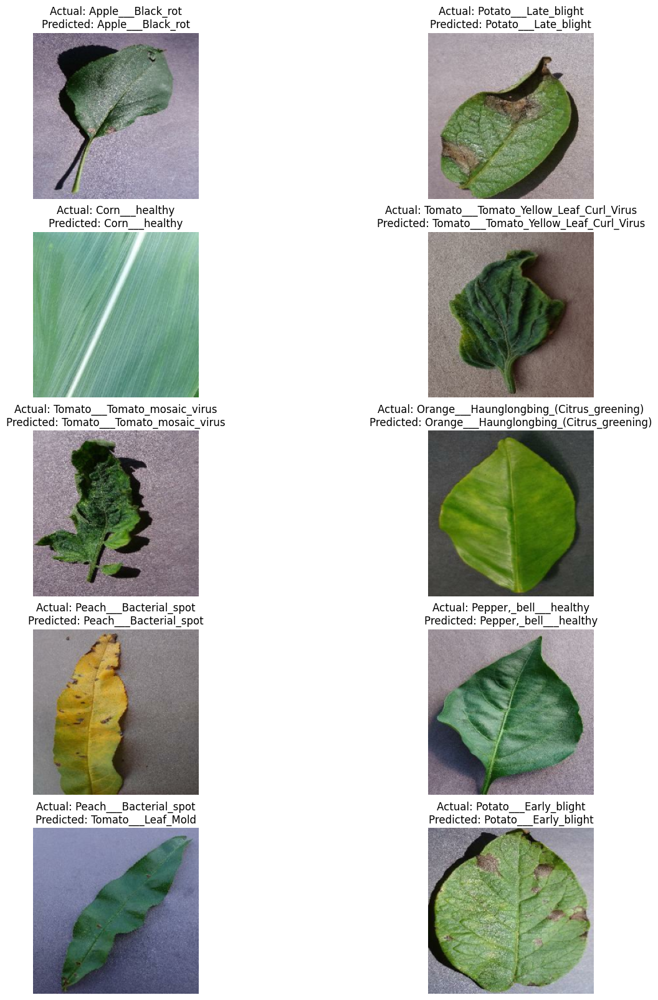

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Get the class names from the dataset info
class_names = info.features['label'].names

# Get a batch of test images and labels
test_batch = next(iter(test_dataset))  # Do not apply .batch() again, as test_dataset is already batched
images, true_labels = test_batch  # Split the batch into images and labels

# Predict the labels using the trained model
predictions = model.predict(images)  # The batch will have the correct shape (32, 224, 224, 3)
predicted_labels = np.argmax(predictions, axis=1)  # Get the index of the highest prediction probability

# Plot the images along with the actual and predicted labels
plt.figure(figsize=(15, 20))
for n in range(10):  # Display 10 random images
    plt.subplot(5, 2, n + 1)
    plt.imshow(images[n].numpy())  # Show the image
    plt.axis('off')

    # Show true and predicted labels
    true_class = class_names[int(true_labels[n])]
    predicted_class = class_names[int(predicted_labels[n])]

    text = f'Actual: {true_class}\nPredicted: {predicted_class}'
    plt.title(text, fontsize=12)

plt.show()


170/170 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.8622 - loss: 0.4816
Test Loss: 0.5026956796646118
Test Accuracy: 0.8626151084899902
170/170 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step


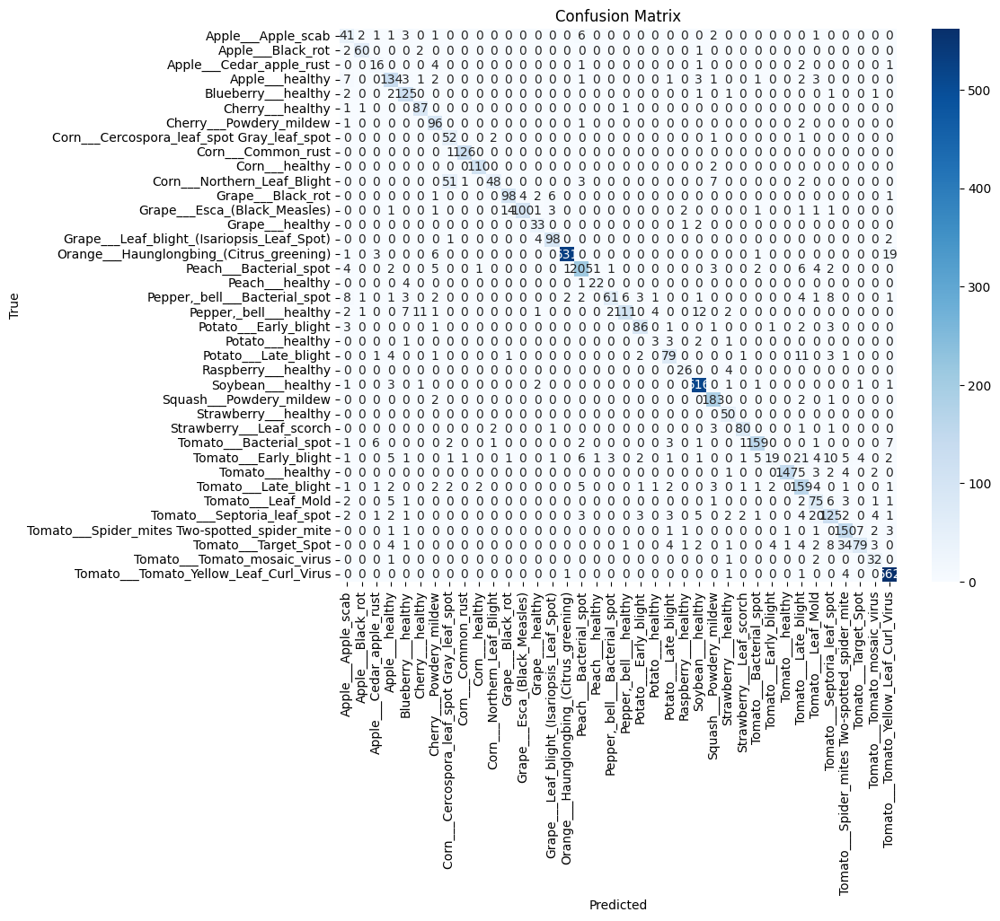

Classification Report:
                                               precision    recall  f1-score   support

                           Apple___Apple_scab       0.51      0.71      0.59        58
                            Apple___Black_rot       0.92      0.92      0.92        65
                     Apple___Cedar_apple_rust       0.55      0.64      0.59        25
                              Apple___healthy       0.80      0.84      0.82       159
                          Blueberry___healthy       0.83      0.94      0.88       133
                             Cherry___healthy       0.85      0.97      0.91        90
                      Cherry___Powdery_mildew       0.77      0.96      0.85       100
   Corn___Cercospora_leaf_spot Gray_leaf_spot       0.47      0.93      0.63        56
                           Corn___Common_rust       0.98      0.99      0.99       127
                               Corn___healthy       0.97      0.98      0.98       112
                  C

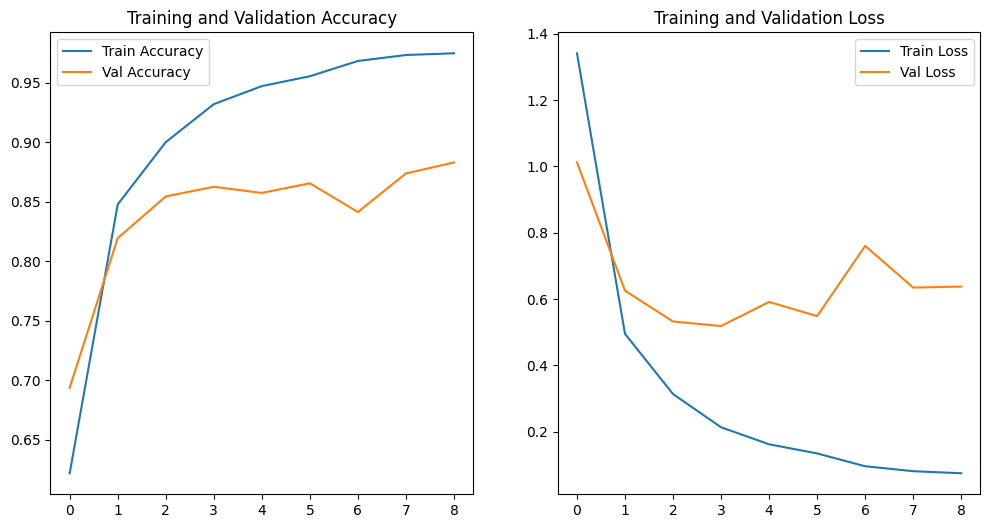

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


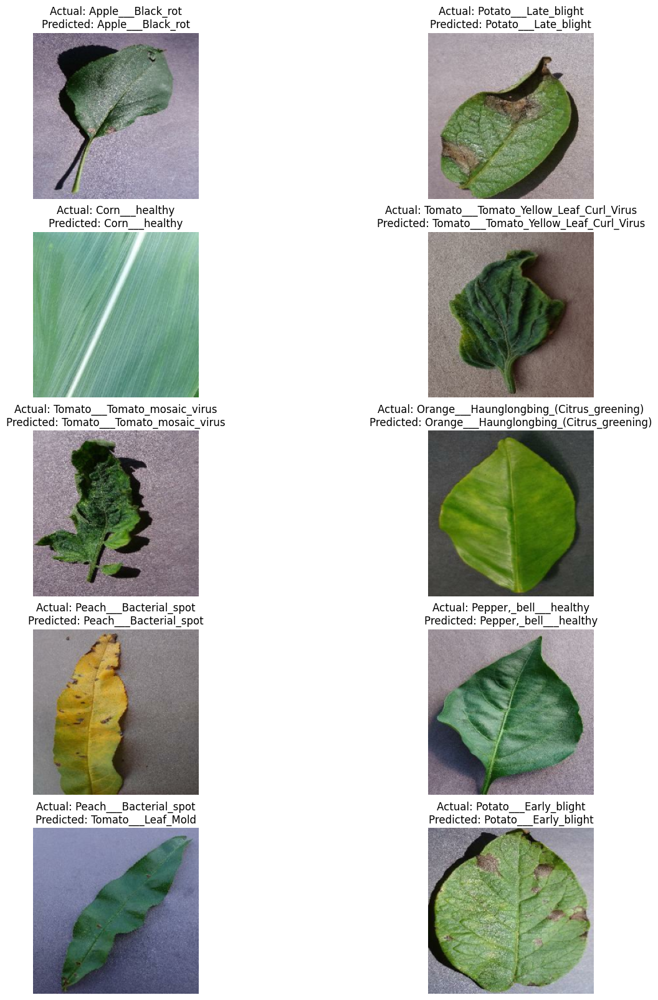

In [ ]:
# Evaluate on the test set
test_loss, test_acc = model.evaluate(test_dataset)
print(f"Test Loss: {test_loss}")
print(f"Test Accuracy: {test_acc}")

# Confusion Matrix and Classification Report
y_true = np.concatenate([y for _, y in test_dataset], axis=0)
y_pred = model.predict(test_dataset)
y_pred_classes = np.argmax(y_pred, axis=1)

conf_matrix = confusion_matrix(y_true, y_pred_classes)
class_report = classification_report(y_true, y_pred_classes, target_names=info.features['label'].names)

# Display confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=info.features['label'].names, yticklabels=info.features['label'].names)
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()

# Print classification report
print('Classification Report:')
print(class_report)

# Plot Training History
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Val Accuracy')
plt.title('Training and Validation Accuracy')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Val Loss')
plt.title('Training and Validation Loss')
plt.legend()

plt.show()

# Get the class names from the dataset info
class_names = info.features['label'].names

# Get a batch of test images and labels
test_batch = next(iter(test_dataset))  # Do not apply .batch() again, as test_dataset is already batched
images, true_labels = test_batch  # Split the batch into images and labels

# Predict the labels using the trained model
predictions = model.predict(images)  # The batch will have the correct shape (32, 224, 224, 3)
predicted_labels = np.argmax(predictions, axis=1)  # Get the index of the highest prediction probability

# Plot the images along with the actual and predicted labels
plt.figure(figsize=(15, 20))
for n in range(10):  # Display 10 random images
    plt.subplot(5, 2, n + 1)
    plt.imshow(images[n].numpy())  # Show the image
    plt.axis('off')

    # Show true and predicted labels
    true_class = class_names[int(true_labels[n])]
    predicted_class = class_names[int(predicted_labels[n])]

    text = f'Actual: {true_class}\nPredicted: {predicted_class}'
    plt.title(text, fontsize=12)

plt.show()
